In [1]:
import cv2

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass - Udemy/Images/people1.jpg')

In [5]:
image.shape

(1280, 1920, 3)

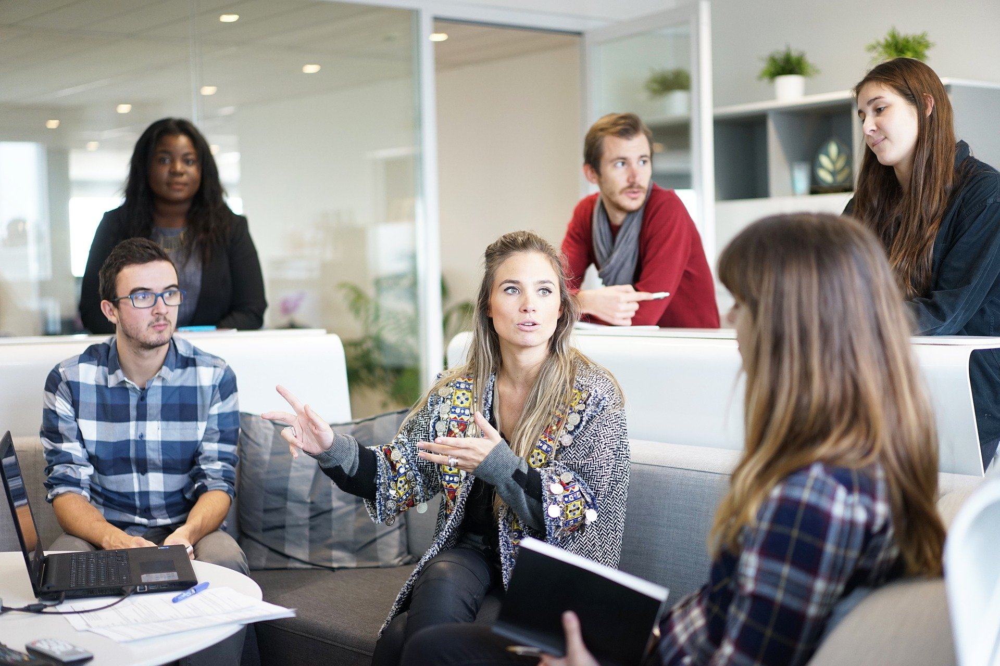

In [7]:
#cv2.imshow(image) Disabled in Colab
from google.colab.patches import cv2_imshow

cv2_imshow(image)

In [11]:
#Need to resize image because it takes too much time to apply a model

image = cv2.resize(image, (800, 600))

image.shape

(600, 800, 3)

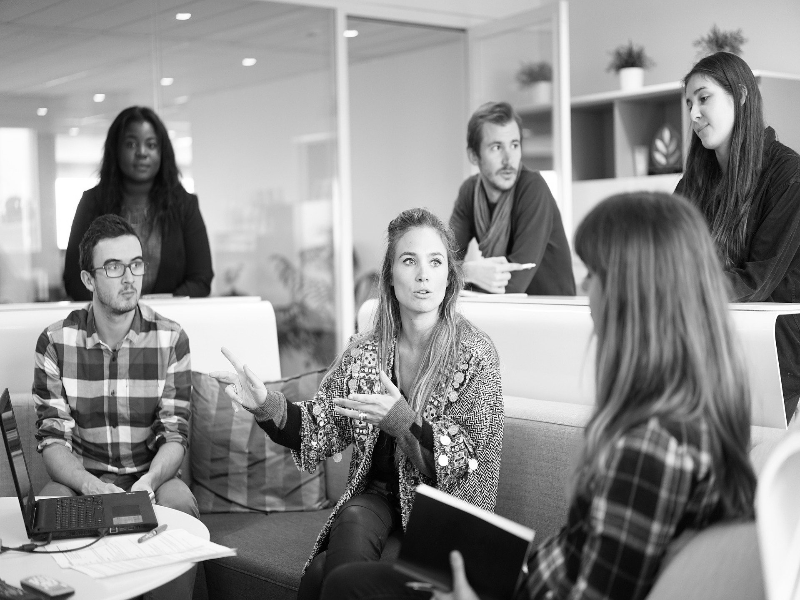

In [13]:
#Why we are using grayscale? Because 800x600 is the total pixels in Image. But if we are using RGB, then 800x600x3 pixels are required
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image_gray)

In [14]:
image.shape

(600, 800, 3)

In [15]:
image_gray.shape

(600, 800)

In [16]:
face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass - Udemy/Cascades/haarcascade_frontalface_default.xml')

In [18]:
detections = face_detector.detectMultiScale(image_gray)

len(detections)

6

In [19]:
detections #First index = X axis, Second = Y axis, Third and Fourth = Size of the face

array([[677,  72,  68,  68],
       [115, 124,  53,  53],
       [475, 123,  59,  59],
       [387, 233,  73,  73],
       [ 92, 239,  66,  66],
       [390, 323,  56,  56]], dtype=int32)

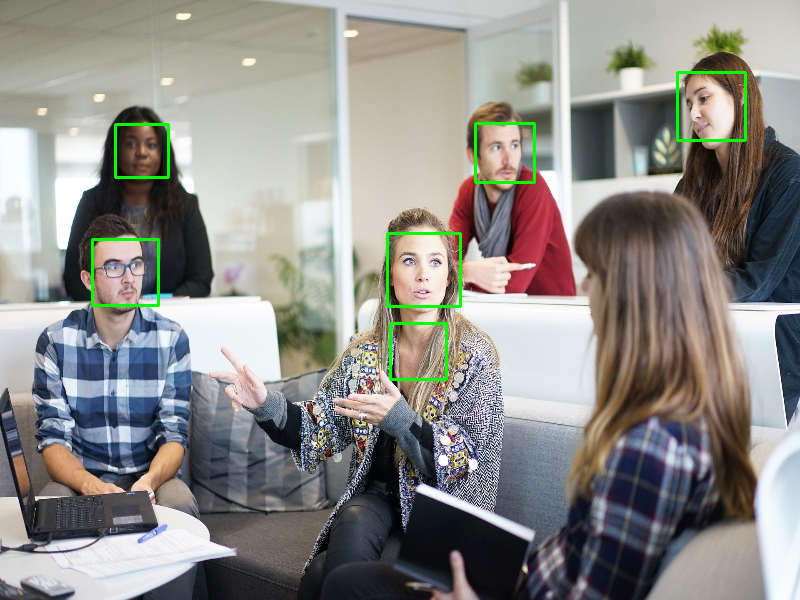

In [22]:
for (x, y, w, h) in detections:
  #print(x, y, w, h)
  cv2.rectangle(image, (x,y), (x + w,y + h), (0,255,0), 2)

cv2_imshow(image)

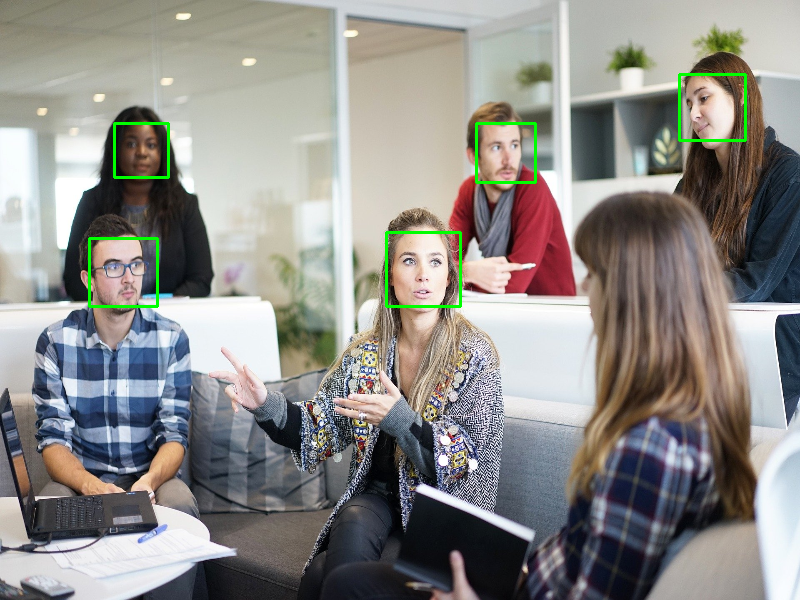

In [33]:
#Haarcascade Parameters to make the model better
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass - Udemy/Images/people1.jpg')
image = cv2.resize(image, (800, 600))
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
improved_detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.08) #scaleFactor How much the image size is reduced, must be greater than 1 (default: 1.1)
for (x, y, w, h) in improved_detections:
  #print(x, y, w, h)
  cv2.rectangle(image, (x,y), (x + w,y + h), (0,255,0), 2)

cv2_imshow(image)

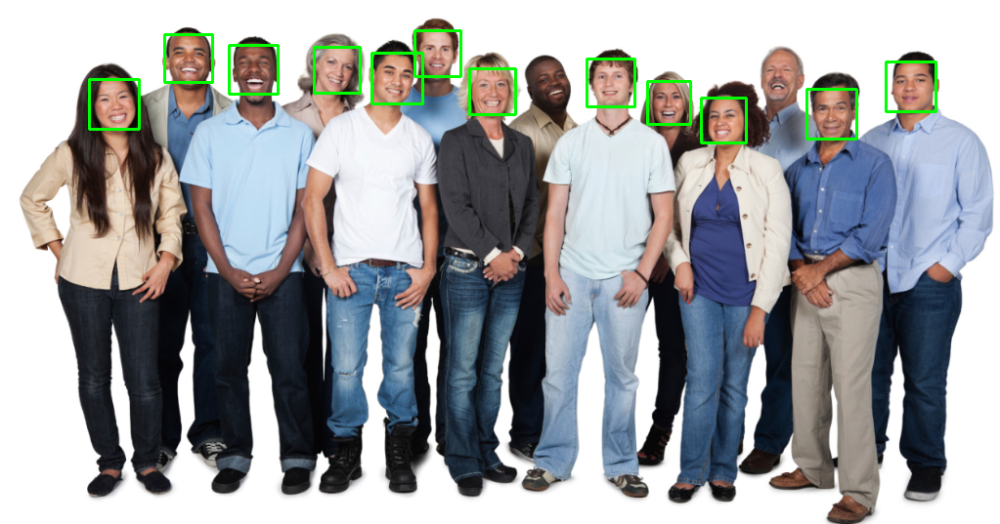

In [49]:
#Haarcascade Parameters to make the model better
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass - Udemy/Images/people2.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
improved_detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.2, minNeighbors=7, minSize = (10,10), maxSize = (100,100)) #minSize default is 30,30 ! maxSize default is
for (x, y, w, h) in improved_detections:
  #print(x, y, w, h)
  cv2.rectangle(image, (x,y), (x + w,y + h), (0,255,0), 2)

cv2_imshow(image)

#Eye Detection

In [51]:
eye_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass - Udemy/Cascades/haarcascade_eye.xml')

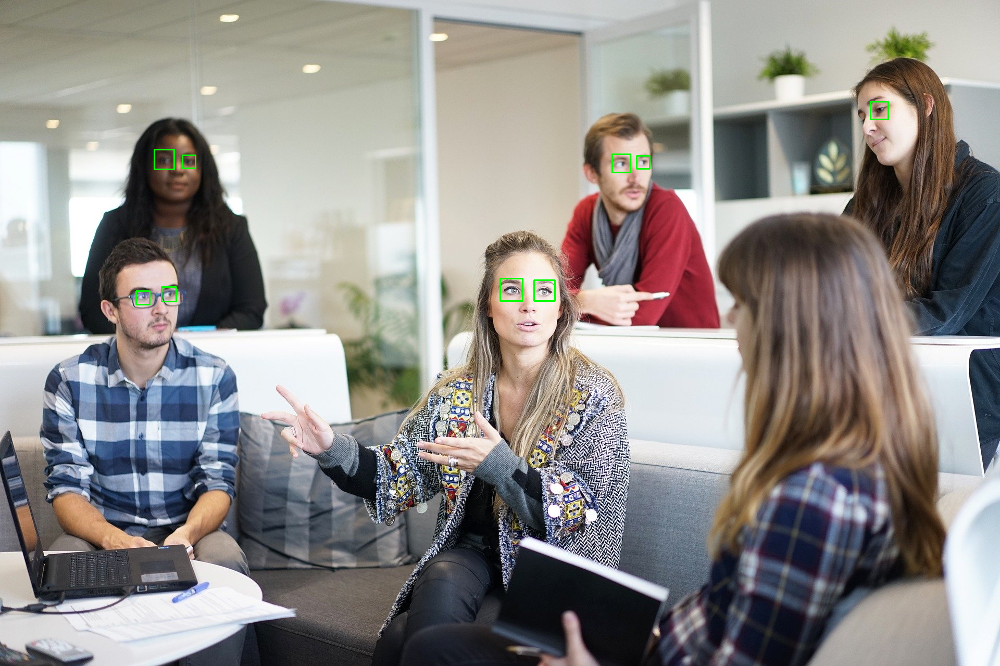

In [66]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass - Udemy/Images/people1.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
improved_detections = eye_detector.detectMultiScale(image_gray, scaleFactor = 1.2, minNeighbors=8, maxSize = (70,70))
for (x, y, w, h) in improved_detections:
  #print(x, y, w, h)
  cv2.rectangle(image, (x,y), (x + w,y + h), (0,255,0), 2)

cv2_imshow(image)